# Detecting Sports using PyTorch

Image classification of sports images into one of over 100 classes of sport.

Notebook adapted from the guided project [Detecting COVID-19 with Chest X Ray using PyTorch](https://www.coursera.org/projects/covid-19-detection-x-ray) on Coursera

Dataset from [here](https://www.kaggle.com/datasets/gpiosenka/sports-classification/versions/8](https://www.kaggle.com/tawsifurrahman/covid19-radiography-database) on Kaggle

# Importing Libraries

In [1]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

print('Using PyTorch version', torch.__version__)

cuda:0
Using PyTorch version 1.11.0


# Preparing Training and Test Sets

In [2]:
class_names = [name for name in os.listdir("../input/sports-classification/test")]

root_dir = '../input/sports-classification'
source_dirs = class_names

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('jpg')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

# Creating Custom Dataset

In [3]:
class SportsDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x.lower().endswith('jpg')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = class_names
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

# Image Transformations

In [4]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Prepare DataLoader

In [5]:

train_dirs = {    
}
for c in class_names:
    train_dirs[c] = os.path.join('../input/sports-classification/train', c)


train_dataset = SportsDataset(train_dirs, train_transform)

Found 138 bobsled examples
Found 137 hurdles examples
Found 117 snow boarding examples
Found 134 fly fishing examples
Found 127 luge examples
Found 135 sidecar racing examples
Found 112 ampute football examples
Found 147 volleyball examples
Found 145 billiards examples
Found 151 giant slalom examples
Found 131 tennis examples
Found 139 horse racing examples
Found 112 pole dancing examples
Found 159 figure skating women examples
Found 159 rollerblade racing examples
Found 135 fencing examples
Found 167 olympic wrestling examples
Found 157 golf examples
Found 99 ultimate examples
Found 147 harness racing examples
Found 191 football examples
Found 133 frisbee examples
Found 125 bungee jumping examples
Found 155 shot put examples
Found 130 ice climbing examples
Found 146 figure skating men examples
Found 143 rowing examples
Found 111 bike polo examples
Found 157 swimming examples
Found 150 judo examples
Found 113 axe throwing examples
Found 132 archery examples
Found 174 baseball examples


In [6]:
test_dirs = {}
for c in [name for name in os.listdir("../input/sports-classification/test")]:
    test_dirs[c] = os.path.join('../input/sports-classification/test', c)
test_dataset = SportsDataset(test_dirs, test_transform)

Found 5 bobsled examples
Found 5 hurdles examples
Found 5 snow boarding examples
Found 5 fly fishing examples
Found 5 luge examples
Found 5 sidecar racing examples
Found 5 ampute football examples
Found 5 volleyball examples
Found 5 billiards examples
Found 5 giant slalom examples
Found 5 tennis examples
Found 5 horse racing examples
Found 5 pole dancing examples
Found 5 figure skating women examples
Found 5 rollerblade racing examples
Found 5 fencing examples
Found 5 olympic wrestling examples
Found 5 golf examples
Found 5 ultimate examples
Found 5 harness racing examples
Found 5 football examples
Found 5 frisbee examples
Found 5 bungee jumping examples
Found 5 shot put examples
Found 5 ice climbing examples
Found 5 figure skating men examples
Found 5 rowing examples
Found 5 bike polo examples
Found 5 swimming examples
Found 5 judo examples
Found 5 axe throwing examples
Found 5 archery examples
Found 5 baseball examples
Found 5 wheelchair basketball examples
Found 5 log rolling exampl

In [7]:
batch_size = 6

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 2262
Number of test batches 84


# Data Visualization

In [8]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(8, 4))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

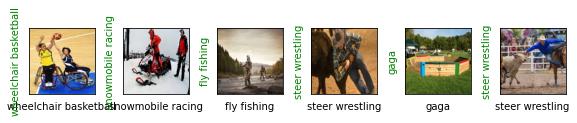

In [9]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

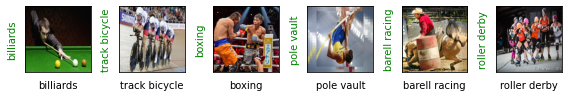

In [10]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

# Creating the Model

In [11]:
resnet18 = torchvision.models.resnet18(pretrained=True)
for param in resnet18.parameters():
    param.requires_grad = False
    
resnet18

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [12]:
class FinalModel(torch.nn.Module):
    def __init__(self):
        super(FinalModel, self).__init__()
        self.f1 = torch.nn.Linear(512, 1000)
        self.f2 = torch.nn.Linear(1000, 500)
        self.f3 = torch.nn.Linear(500, len(class_names))

    def forward(self, x):
        x = self.f1(x)
        x = torch.nn.functional.relu(x)
        x = self.f2(x)
        x = torch.nn.functional.relu(x)
        x = self.f3(x)
        return x

In [13]:
resnet18.fc = FinalModel()
#torch.nn.Linear(in_features=512, out_features=len(class_names))
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)

In [14]:
def show_preds():
    resnet18.eval()
    images, labels = next(iter(dl_test))
    outputs = resnet18(images)
    _, preds = torch.max(outputs, 1)
    preds = preds
    show_images(images, labels, preds)

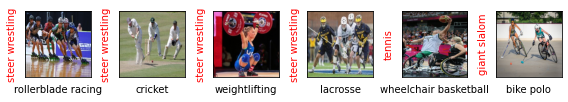

In [15]:
show_preds()

# Training the Model

In [16]:
from tqdm.notebook import tqdm, trange
def train(epochs):
    print('Starting training..')
    for e in trange(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        resnet18.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 200 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                resnet18.train()

                if accuracy >= 0.95:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..


  0%|          | 0/10 [00:00<?, ?it/s]

Starting epoch 1/10
Evaluating at step 0
Validation Loss: 4.6115, Accuracy: 0.0100


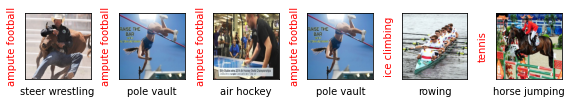

Evaluating at step 200
Validation Loss: 4.5927, Accuracy: 0.0080


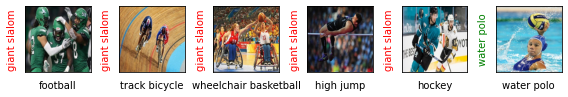

Evaluating at step 400
Validation Loss: 4.4947, Accuracy: 0.1080


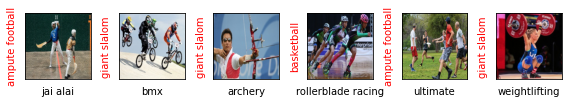

Evaluating at step 600
Validation Loss: 4.3386, Accuracy: 0.1800


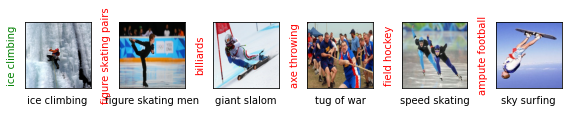

Evaluating at step 800
Validation Loss: 4.0864, Accuracy: 0.2220


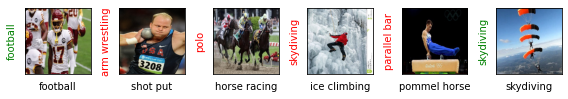

Evaluating at step 1000
Validation Loss: 3.8672, Accuracy: 0.2280


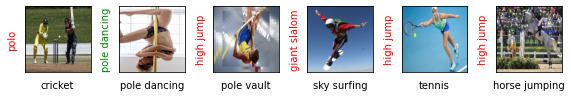

Evaluating at step 1200
Validation Loss: 3.6107, Accuracy: 0.3080


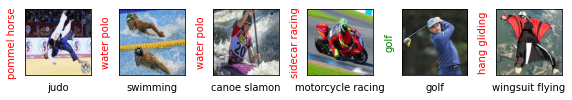

Evaluating at step 1400
Validation Loss: 3.2696, Accuracy: 0.3720


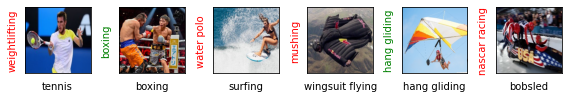

Evaluating at step 1600
Validation Loss: 3.1779, Accuracy: 0.3460


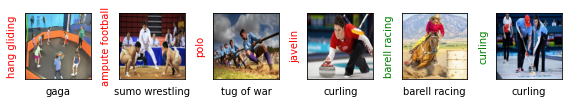

Evaluating at step 1800
Validation Loss: 2.8102, Accuracy: 0.4760


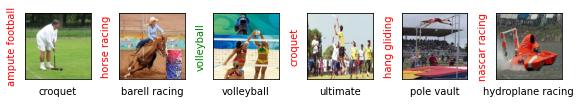

Evaluating at step 2000
Validation Loss: 2.6309, Accuracy: 0.4600


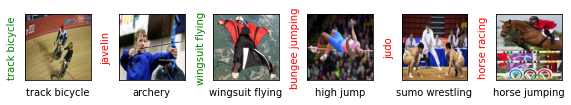

Evaluating at step 2200
Validation Loss: 2.4937, Accuracy: 0.4800


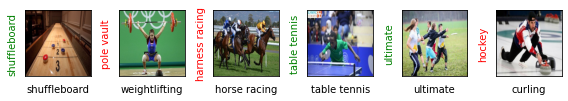

Training Loss: 3.8660
Starting epoch 2/10
Evaluating at step 0
Validation Loss: 2.2608, Accuracy: 0.5420


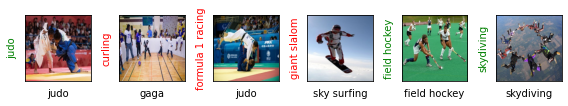

Evaluating at step 200
Validation Loss: 2.3120, Accuracy: 0.5580


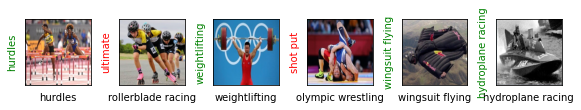

Evaluating at step 400
Validation Loss: 2.1391, Accuracy: 0.5680


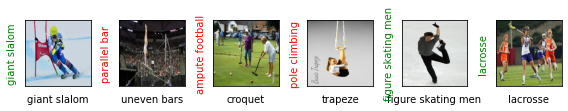

Evaluating at step 600
Validation Loss: 1.9837, Accuracy: 0.6020


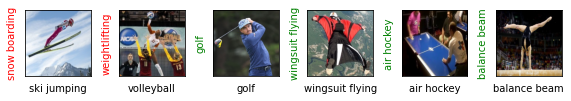

Evaluating at step 800
Validation Loss: 1.8911, Accuracy: 0.5520


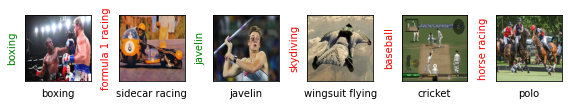

Evaluating at step 1000
Validation Loss: 1.8063, Accuracy: 0.5880


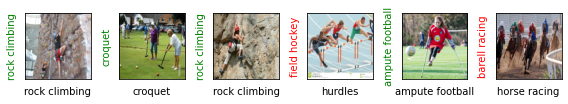

Evaluating at step 1200
Validation Loss: 1.6967, Accuracy: 0.5960


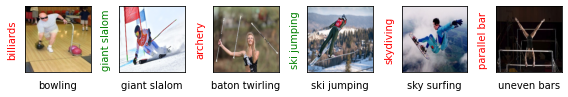

Evaluating at step 1400
Validation Loss: 1.6810, Accuracy: 0.6280


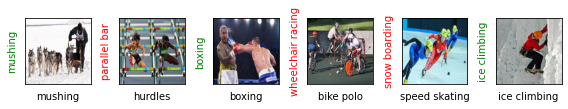

Evaluating at step 1600
Validation Loss: 1.5698, Accuracy: 0.6760


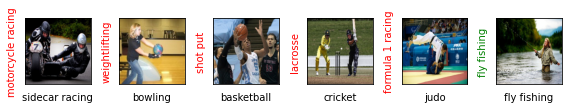

Evaluating at step 1800
Validation Loss: 1.6010, Accuracy: 0.5840


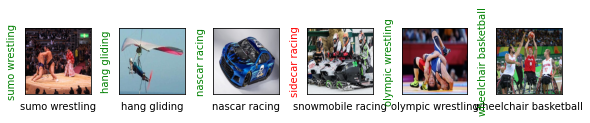

Evaluating at step 2000
Validation Loss: 1.5069, Accuracy: 0.6340


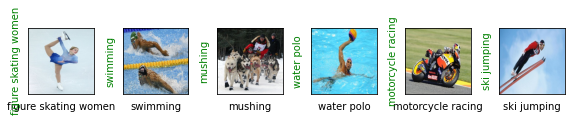

Evaluating at step 2200
Validation Loss: 1.4094, Accuracy: 0.6820


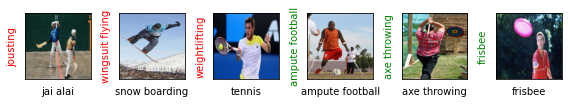

Training Loss: 2.4132
Starting epoch 3/10
Evaluating at step 0
Validation Loss: 1.4659, Accuracy: 0.6500


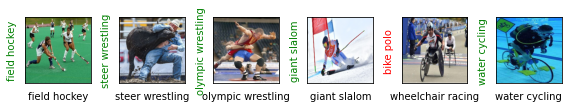

Evaluating at step 200
Validation Loss: 1.3056, Accuracy: 0.6920


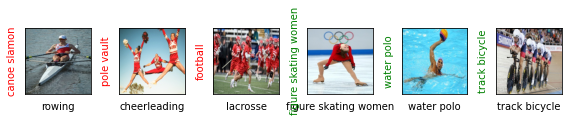

Evaluating at step 400
Validation Loss: 1.2922, Accuracy: 0.7040


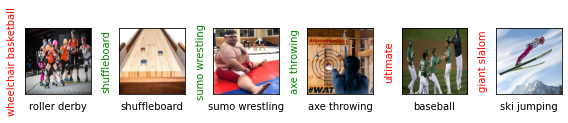

Evaluating at step 600
Validation Loss: 1.2609, Accuracy: 0.6780


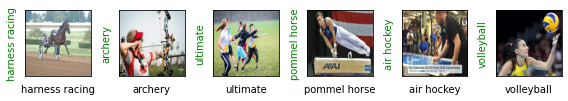

Evaluating at step 800
Validation Loss: 1.1600, Accuracy: 0.7380


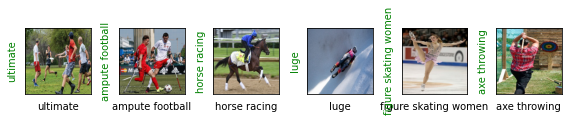

Evaluating at step 1000
Validation Loss: 1.1989, Accuracy: 0.6940


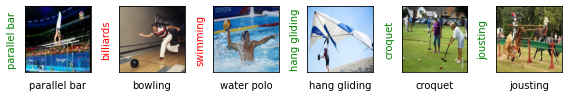

Evaluating at step 1200
Validation Loss: 1.1183, Accuracy: 0.7080


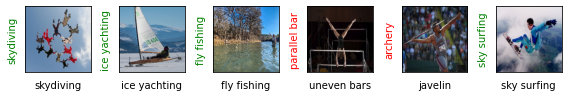

Evaluating at step 1400
Validation Loss: 1.0651, Accuracy: 0.7240


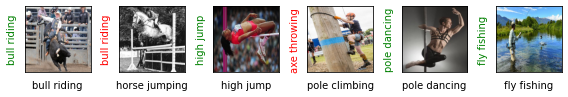

Evaluating at step 1600
Validation Loss: 1.0541, Accuracy: 0.7600


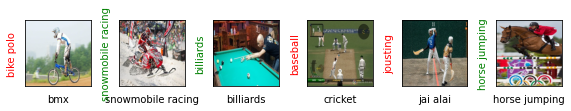

Evaluating at step 1800
Validation Loss: 1.0259, Accuracy: 0.7640


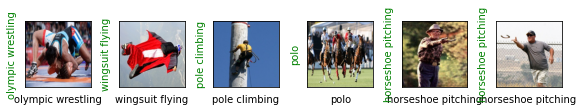

Evaluating at step 2000
Validation Loss: 1.0957, Accuracy: 0.7040


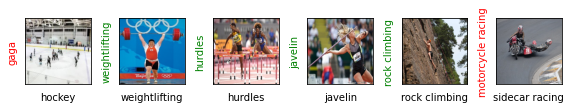

Evaluating at step 2200
Validation Loss: 1.0278, Accuracy: 0.7400


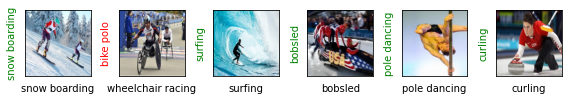

Training Loss: 1.8143
Starting epoch 4/10
Evaluating at step 0
Validation Loss: 0.9466, Accuracy: 0.7360


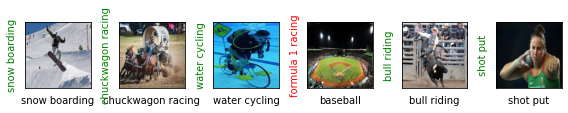

Evaluating at step 200
Validation Loss: 1.0169, Accuracy: 0.7200


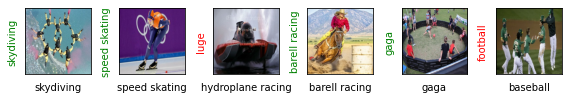

Evaluating at step 400
Validation Loss: 0.9879, Accuracy: 0.7420


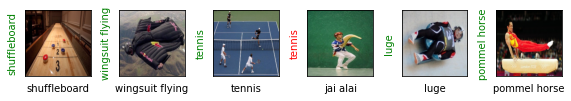

Evaluating at step 600
Validation Loss: 0.8927, Accuracy: 0.7780


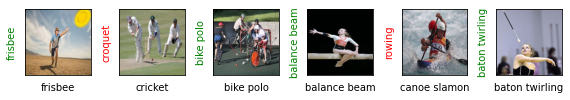

Evaluating at step 800
Validation Loss: 0.9377, Accuracy: 0.7620


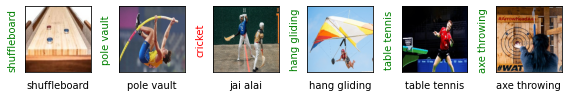

Evaluating at step 1000
Validation Loss: 0.8875, Accuracy: 0.7340


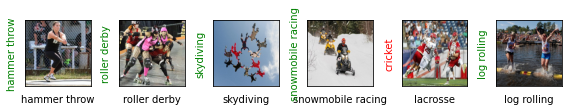

Evaluating at step 1200
Validation Loss: 0.9097, Accuracy: 0.7100


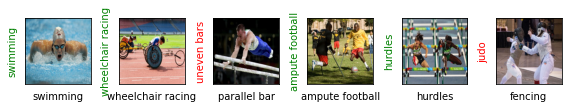

Evaluating at step 1400
Validation Loss: 0.8249, Accuracy: 0.7660


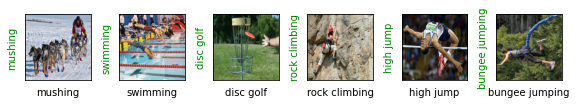

Evaluating at step 1600
Validation Loss: 0.8787, Accuracy: 0.7620


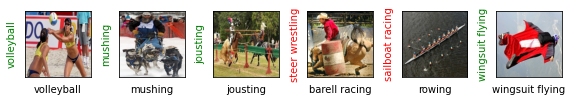

Evaluating at step 1800
Validation Loss: 0.8742, Accuracy: 0.7580


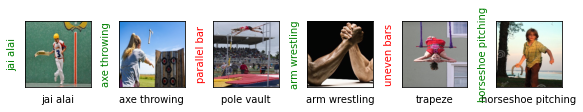

Evaluating at step 2000
Validation Loss: 0.8186, Accuracy: 0.7880


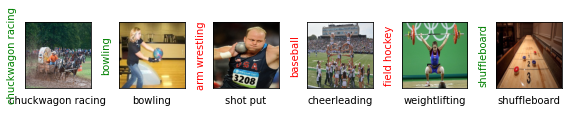

Evaluating at step 2200
Validation Loss: 0.8031, Accuracy: 0.7740


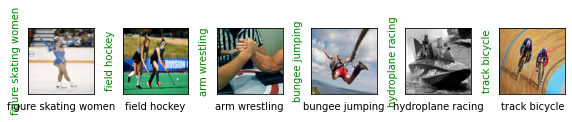

Training Loss: 1.5521
Starting epoch 5/10
Evaluating at step 0
Validation Loss: 0.8249, Accuracy: 0.7460


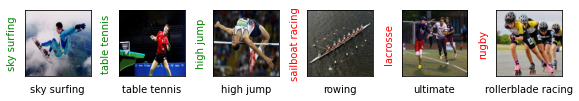

Evaluating at step 200
Validation Loss: 0.7580, Accuracy: 0.8000


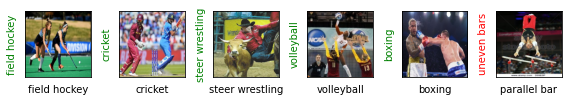

Evaluating at step 400
Validation Loss: 0.8388, Accuracy: 0.7600


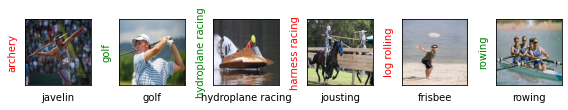

Evaluating at step 600
Validation Loss: 0.7464, Accuracy: 0.8120


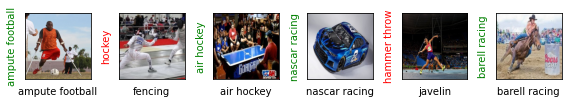

Evaluating at step 800
Validation Loss: 0.7750, Accuracy: 0.7980


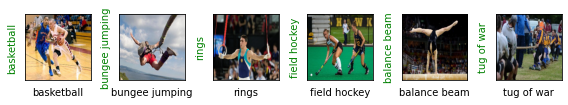

Evaluating at step 1000
Validation Loss: 0.7043, Accuracy: 0.8040


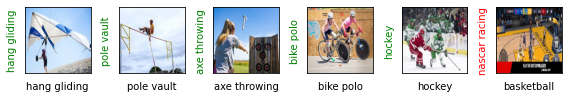

Evaluating at step 1200
Validation Loss: 0.7845, Accuracy: 0.7760


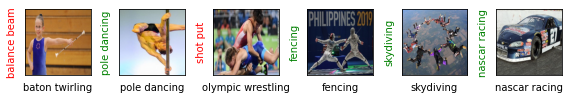

Evaluating at step 1400
Validation Loss: 0.7591, Accuracy: 0.8060


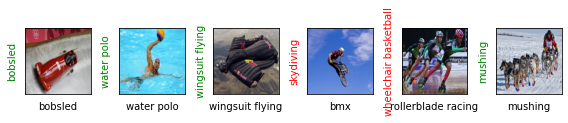

Evaluating at step 1600
Validation Loss: 0.7144, Accuracy: 0.8040


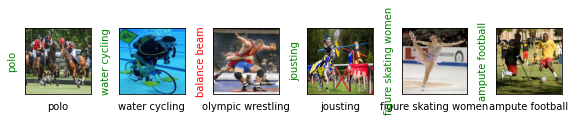

Evaluating at step 1800
Validation Loss: 0.8281, Accuracy: 0.7760


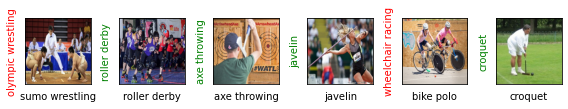

Evaluating at step 2000
Validation Loss: 0.6692, Accuracy: 0.8160


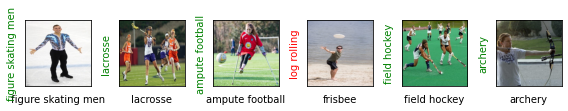

Evaluating at step 2200
Validation Loss: 0.7111, Accuracy: 0.8020


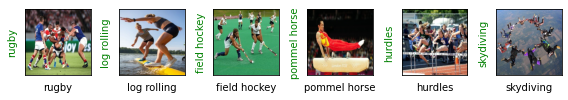

Training Loss: 1.3479
Starting epoch 6/10
Evaluating at step 0
Validation Loss: 0.6620, Accuracy: 0.7820


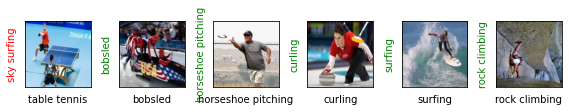

Evaluating at step 200
Validation Loss: 0.6686, Accuracy: 0.8240


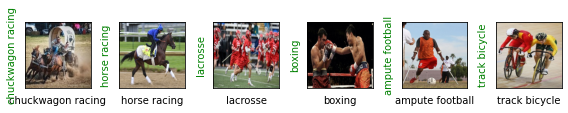

Evaluating at step 400
Validation Loss: 0.5864, Accuracy: 0.8440


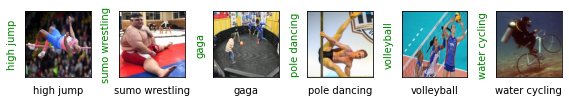

Evaluating at step 600
Validation Loss: 0.6813, Accuracy: 0.7880


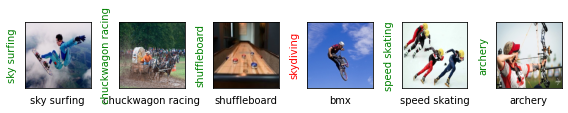

Evaluating at step 800
Validation Loss: 0.6813, Accuracy: 0.8100


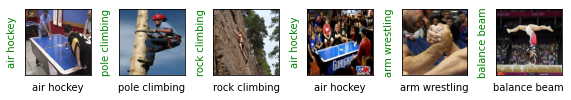

Evaluating at step 1000
Validation Loss: 0.6288, Accuracy: 0.8380


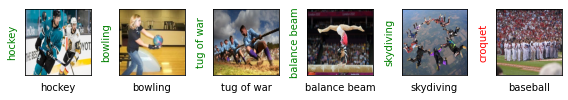

Evaluating at step 1200
Validation Loss: 0.5845, Accuracy: 0.8260


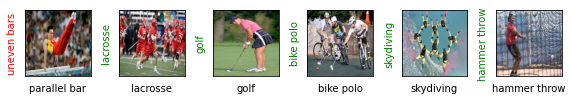

Evaluating at step 1400
Validation Loss: 0.6475, Accuracy: 0.8220


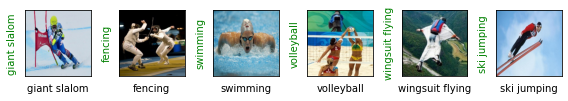

Evaluating at step 1600
Validation Loss: 0.6237, Accuracy: 0.8220


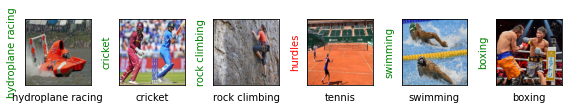

Evaluating at step 1800
Validation Loss: 0.6294, Accuracy: 0.7900


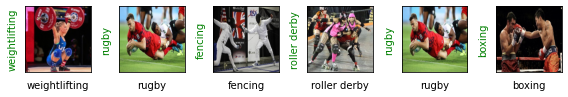

Evaluating at step 2000
Validation Loss: 0.5553, Accuracy: 0.8520


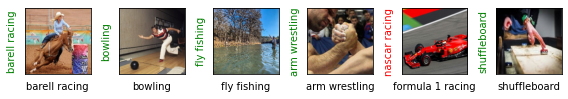

Evaluating at step 2200
Validation Loss: 0.6206, Accuracy: 0.8140


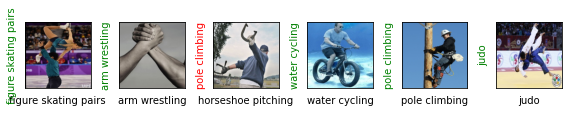

Training Loss: 1.2174
Starting epoch 7/10
Evaluating at step 0
Validation Loss: 0.5541, Accuracy: 0.8440


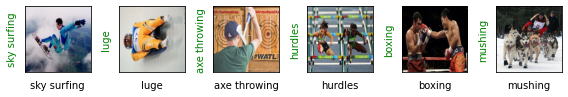

Evaluating at step 200
Validation Loss: 0.5607, Accuracy: 0.8340


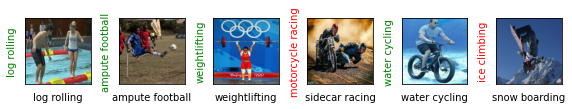

Evaluating at step 400
Validation Loss: 0.5631, Accuracy: 0.8280


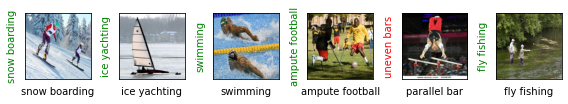

Evaluating at step 600
Validation Loss: 0.5107, Accuracy: 0.8840


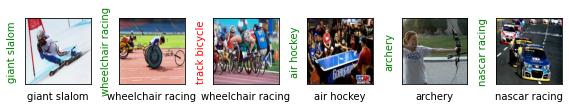

Evaluating at step 800
Validation Loss: 0.6351, Accuracy: 0.8200


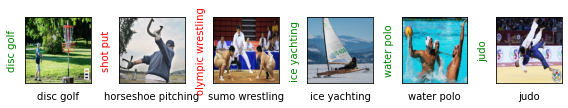

Evaluating at step 1000
Validation Loss: 0.6170, Accuracy: 0.8100


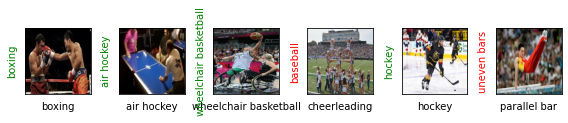

Evaluating at step 1200
Validation Loss: 0.6019, Accuracy: 0.8100


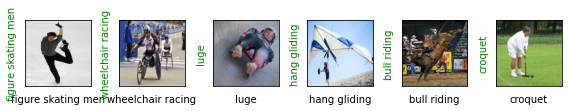

Evaluating at step 1400
Validation Loss: 0.5771, Accuracy: 0.8360


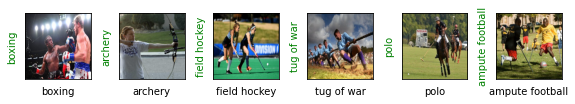

Evaluating at step 1600
Validation Loss: 0.5320, Accuracy: 0.8380


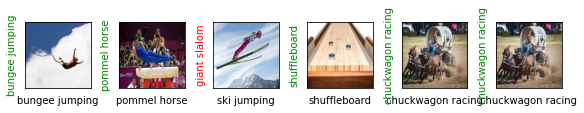

Evaluating at step 1800
Validation Loss: 0.5495, Accuracy: 0.8380


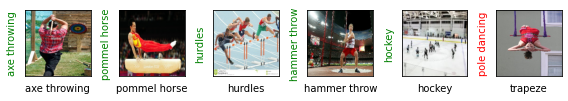

Evaluating at step 2000
Validation Loss: 0.5524, Accuracy: 0.8460


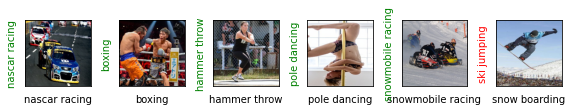

Evaluating at step 2200
Validation Loss: 0.5830, Accuracy: 0.8360


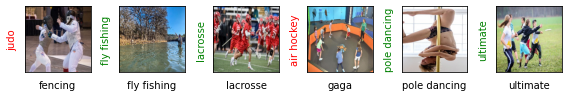

Training Loss: 1.1277
Starting epoch 8/10
Evaluating at step 0
Validation Loss: 0.5188, Accuracy: 0.8360


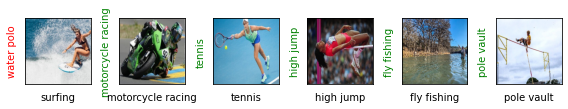

Evaluating at step 200
Validation Loss: 0.5433, Accuracy: 0.8400


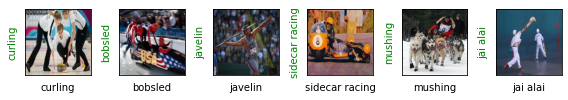

Evaluating at step 400
Validation Loss: 0.5288, Accuracy: 0.8340


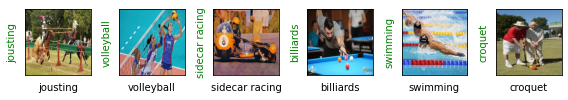

Evaluating at step 600
Validation Loss: 0.5402, Accuracy: 0.8280


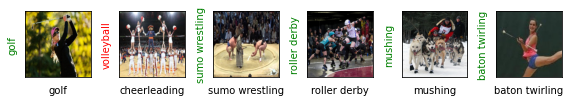

Evaluating at step 800
Validation Loss: 0.5116, Accuracy: 0.8580


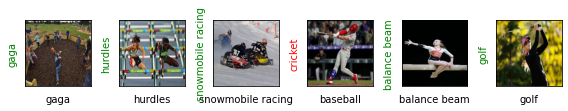

Evaluating at step 1000
Validation Loss: 0.4900, Accuracy: 0.8620


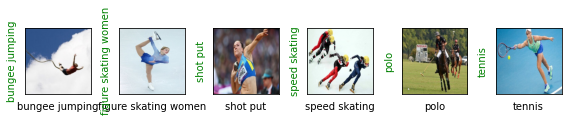

Evaluating at step 1200
Validation Loss: 0.5168, Accuracy: 0.8720


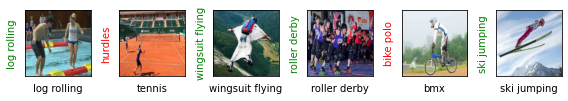

Evaluating at step 1400
Validation Loss: 0.5185, Accuracy: 0.8480


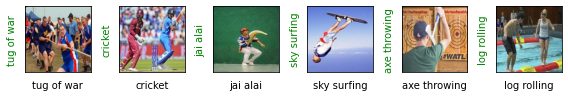

Evaluating at step 1600
Validation Loss: 0.5431, Accuracy: 0.8500


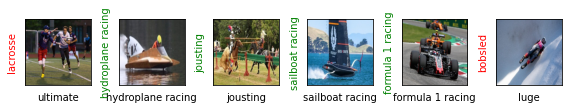

Evaluating at step 1800
Validation Loss: 0.4867, Accuracy: 0.8540


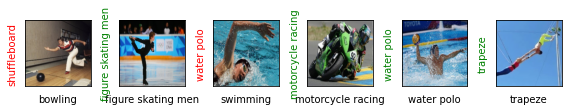

Evaluating at step 2000
Validation Loss: 0.5786, Accuracy: 0.8320


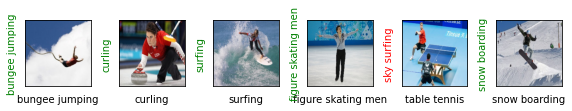

Evaluating at step 2200
Validation Loss: 0.5311, Accuracy: 0.8260


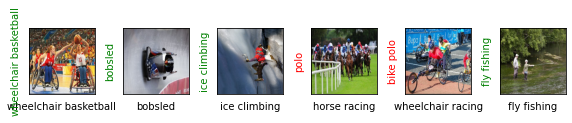

Training Loss: 1.0812
Starting epoch 9/10
Evaluating at step 0
Validation Loss: 0.5407, Accuracy: 0.8400


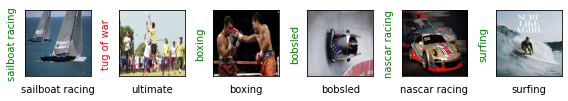

Evaluating at step 200
Validation Loss: 0.5146, Accuracy: 0.8580


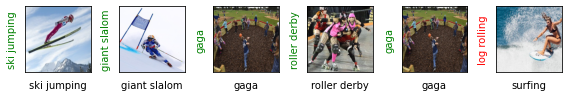

Evaluating at step 400
Validation Loss: 0.5129, Accuracy: 0.8340


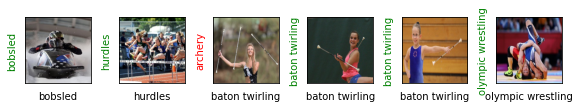

Evaluating at step 600
Validation Loss: 0.4497, Accuracy: 0.8500


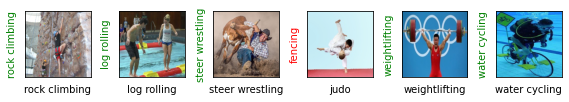

Evaluating at step 800
Validation Loss: 0.4572, Accuracy: 0.8700


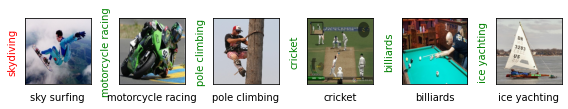

Evaluating at step 1000
Validation Loss: 0.4380, Accuracy: 0.8720


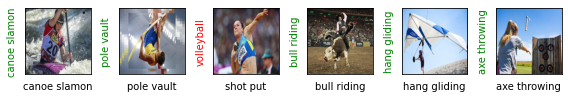

Evaluating at step 1200
Validation Loss: 0.4821, Accuracy: 0.8600


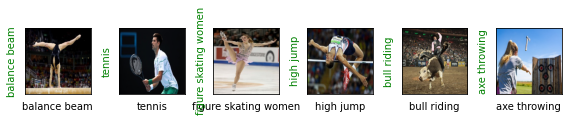

Evaluating at step 1400
Validation Loss: 0.4721, Accuracy: 0.8560


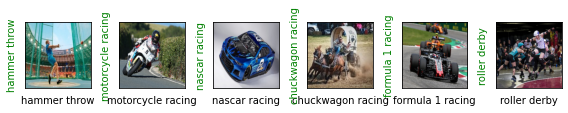

Evaluating at step 1600
Validation Loss: 0.4376, Accuracy: 0.8520


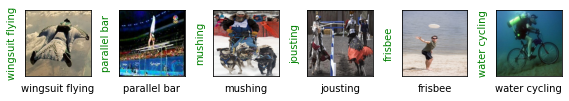

Evaluating at step 1800
Validation Loss: 0.5103, Accuracy: 0.8600


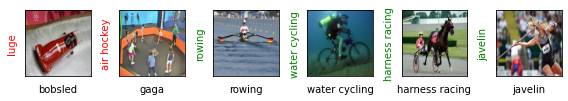

Evaluating at step 2000
Validation Loss: 0.5328, Accuracy: 0.8400


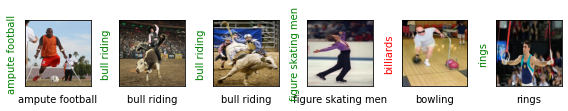

Evaluating at step 2200
Validation Loss: 0.4485, Accuracy: 0.8560


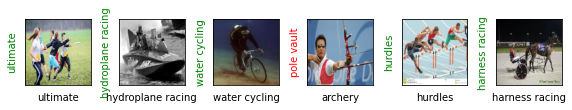

Training Loss: 0.9992
Starting epoch 10/10
Evaluating at step 0
Validation Loss: 0.3978, Accuracy: 0.8800


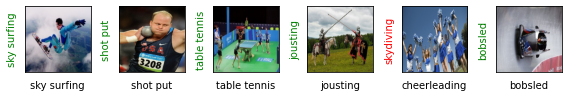

Evaluating at step 200
Validation Loss: 0.4103, Accuracy: 0.8780


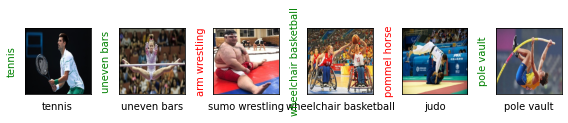

Evaluating at step 400
Validation Loss: 0.4583, Accuracy: 0.8660


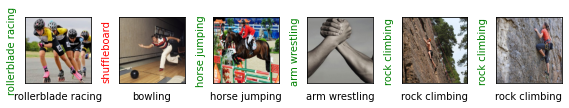

Evaluating at step 600
Validation Loss: 0.4900, Accuracy: 0.8560


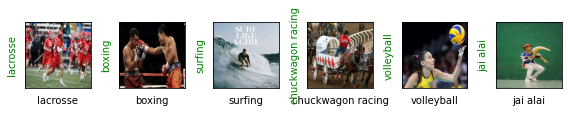

Evaluating at step 800
Validation Loss: 0.4748, Accuracy: 0.8500


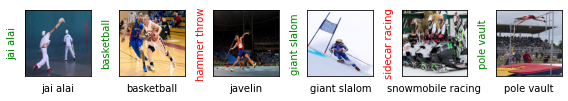

Evaluating at step 1000
Validation Loss: 0.4814, Accuracy: 0.8520


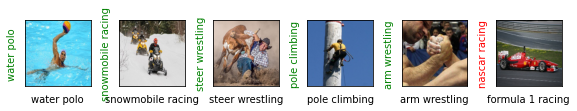

Evaluating at step 1200
Validation Loss: 0.4443, Accuracy: 0.8540


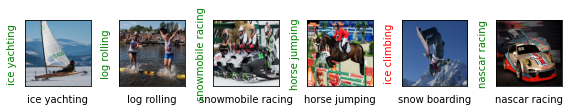

Evaluating at step 1400
Validation Loss: 0.3857, Accuracy: 0.8920


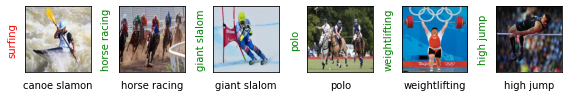

Evaluating at step 1600
Validation Loss: 0.4721, Accuracy: 0.8680


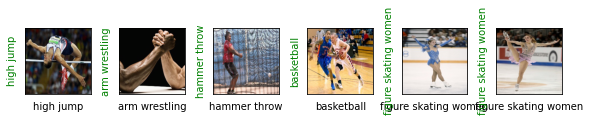

Evaluating at step 1800
Validation Loss: 0.4370, Accuracy: 0.8660


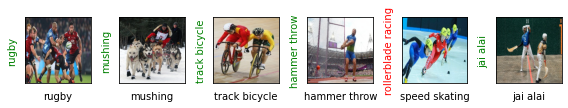

Evaluating at step 2000
Validation Loss: 0.4504, Accuracy: 0.8460


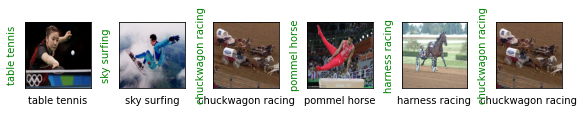

Evaluating at step 2200
Validation Loss: 0.4406, Accuracy: 0.8880


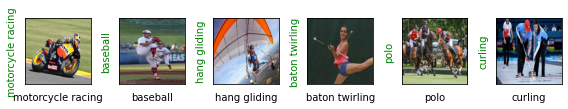

Training Loss: 0.9639
Training complete..
CPU times: user 2h 56min 41s, sys: 9min 24s, total: 3h 6min 6s
Wall time: 3h 10min 9s


In [17]:
%%time

train(epochs=10)

# Final Results

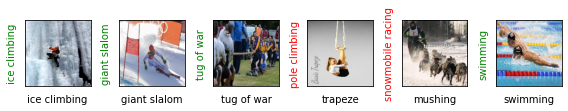

In [18]:
show_preds()

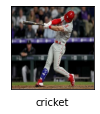

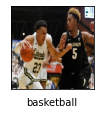

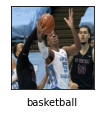

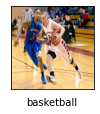

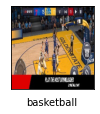

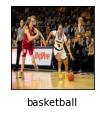

In [19]:
predict_dir = '../input/sports-classification/images to predict'
images = os.listdir(predict_dir)
predict_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])



#images = [Image.open(os.path.join(predict_dir, i)).convert('RGB') for i in images]
for i in images:
    image = Image.open(os.path.join(predict_dir, i)).convert('RGB')
    image = predict_transform(image)
    image = image.unsqueeze(0)

    outputs = resnet18(image)
    _, preds = torch.max(outputs, 1)
    plt.figure(figsize=(8, 4))

    image = image.squeeze(0)
    plt.subplot(1, 6,1, xticks=[], yticks=[])
    image = image.numpy().transpose((1,2,0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image * std + mean
    image = np.clip(image, 0., 1.)
    plt.imshow(image)
    plt.xlabel(f'{class_names[int(preds[0].numpy())]}')
    plt.tight_layout()
    plt.show()
    

